In [1]:
import numpy as np
import scanpy as sc
import torch
import pandas as pd
import matplotlib.pyplot as plt
from scarches.dataset.trvae.data_handling import remove_sparsity
from lataq.models import EMBEDCVAE
from sklearn.metrics import classification_report

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
unlabeled_strat = "batch"
cells_per_ct = 2000

# Model Params
latent_dim = 10
use_mmd = False

# Training Params
alpha_epoch_anneal = 1e6
eta = 10
tau = 0
clustering_res = 1
labeled_loss_metric = "dist"
unlabeled_loss_metric = "dist"
class_metric = "dist"

early_stopping_kwargs = {
    "early_stopping_metric": "val_classifier_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [4]:
DATA_DIR = '../data'
adata = sc.read(
    f'{DATA_DIR}/haniffa_healthy_obsmProt.h5ad'
)
condition_key = 'patient_id'
cell_type_key = ["initial_clustering"]
adata = adata[adata.obs[cell_type_key[0]] != 'Mono_prolif']
reference = [
    'CV0902',
    'CV0904',
    'CV0911',
    'CV0915',
    'CV0926',
    'CV0929',
    'CV0934',
    'CV0940',
    'CV0944',
    'MH8919176',
    'MH8919177',
    'MH8919179',
    'MH8919226',
    'MH8919282',
    'MH8919283',
    'MH8919333',
    
]
query = [
    'CV0917',
    'CV0939',
    'MH8919178',
    'MH8919227',
    'MH8919332',
    'newcastle65',
    'newcastle74'
    
]
adata.obs['query'] = adata.obs[condition_key].isin(query).astype('category')

Trying to set attribute `.obs` of view, copying.


In [5]:
adata_tmp = adata.copy()
sc.pp.normalize_total(adata_tmp)
sc.pp.log1p(adata_tmp)

In [6]:
sc.pp.highly_variable_genes(adata_tmp, n_top_genes=4000)
adata.var = adata_tmp.var

In [7]:
adata = adata[:, adata.var['highly_variable']]

In [8]:
source_adata = adata[adata.obs[condition_key].isin(reference)].copy()
target_adata = adata[adata.obs[condition_key].isin(query)].copy()

In [9]:
source_adata

AnnData object with n_obs × n_vars = 62690 × 4000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'query'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'protein_expression'

In [10]:
tranvae = EMBEDCVAE(
    adata=source_adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_key,
    hidden_layer_sizes=[128, 128, 128, 128],
    latent_dim=latent_dim,
    use_mmd=use_mmd,
)

Embedding dictionary:
 	Num conditions: 16
 	Embedding dim: 10
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 0
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Hidden Layer 3 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 10
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Hidden Layer 3 in/out: 128 128
	Output Layer in/out:  128 4000 



In [11]:
tranvae.train(
    n_epochs=100,
    early_stopping_kwargs=early_stopping_kwargs,
    pretraining_epochs=80,
    alpha_epoch_anneal=alpha_epoch_anneal,
    eta=eta,
    tau=tau,
    clustering_res=clustering_res,
    labeled_loss_metric=labeled_loss_metric,
    unlabeled_loss_metric=unlabeled_loss_metric
)

 |████████████████████| 100.0%  - val_loss: 651.3739673848 - val_trvae_loss: 636.2842008630 - val_classifier_loss: 15.0897684706 - val_labeled_loss: 1.5089768284
Saving best state of network...
Best State was in Epoch 99


In [12]:
ref_path = f'../pr/ref_model_haniffa'
tranvae.save(ref_path, overwrite=True)

In [13]:
tranvae.model.n_cell_types

17

In [14]:
data_latent = tranvae.get_latent(x=source_adata.X.A, c=source_adata.obs[condition_key])
adata_latent = sc.AnnData(data_latent)
adata_latent.obs[condition_key] = source_adata.obs[condition_key].tolist()
adata_latent.obs[cell_type_key[0]] = source_adata.obs[cell_type_key[0]].tolist()

In [15]:
landmarks = tranvae.get_landmarks_info()
full_latent = adata_latent.concatenate(landmarks, batch_key=None)

In [16]:
sc.pp.neighbors(adata_latent)
sc.tl.leiden(adata_latent)
sc.tl.umap(adata_latent)

... storing 'patient_id' as categorical
... storing 'initial_clustering' as categorical


[<AxesSubplot:title={'center':'patient_id'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'initial_clustering'}, xlabel='UMAP1', ylabel='UMAP2'>]

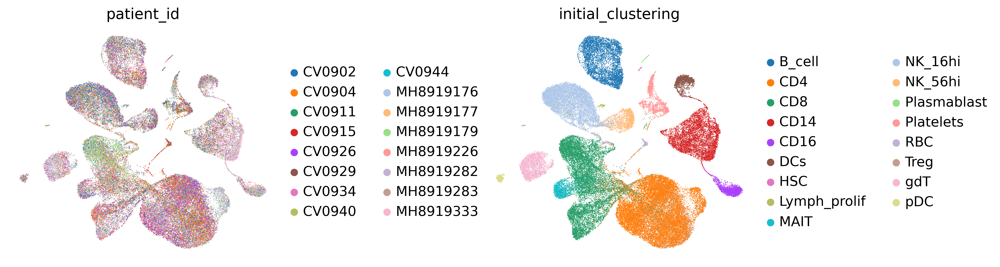

In [17]:
sc.pl.umap(adata_latent,
           color=[condition_key, cell_type_key[0]],
           frameon=False,
           wspace=0.6,
           show=False
           )


In [18]:
sc.pp.neighbors(full_latent)
sc.tl.umap(full_latent)

... storing 'patient_id' as categorical
... storing 'initial_clustering' as categorical
... storing 'initial_clustering_pred' as categorical
Trying to set attribute `.uns` of view, copying.


Text(0.5, 1.0, 'Landmarks')

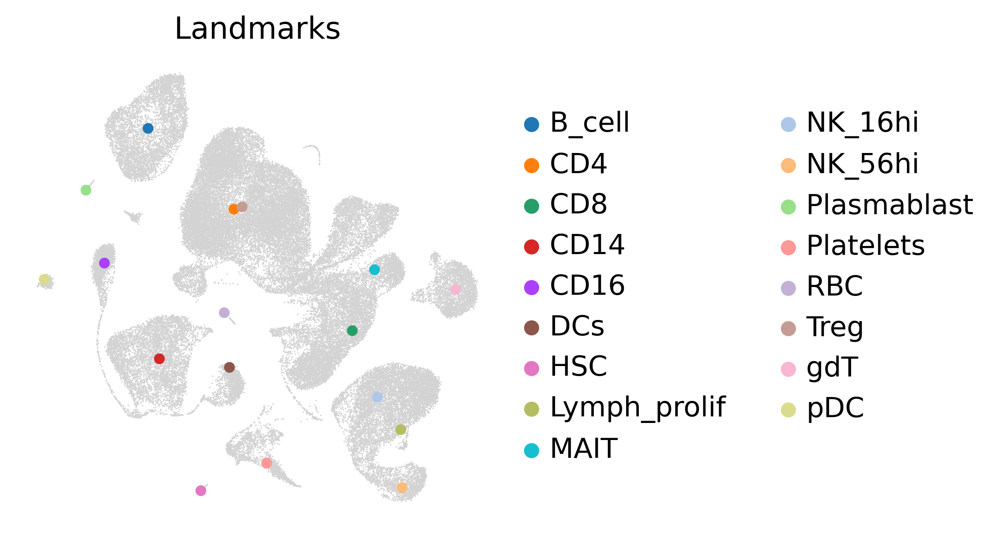

In [19]:
fig, ax = plt.subplots(1, 1)
sc.pl.umap(full_latent, ax=ax, show=False)
sc.pl.umap(
    full_latent[full_latent.obs[condition_key].str.contains('Landmark')],
    size=100,
    color=cell_type_key[0],
    ax=ax,
    frameon=False,
    show=False
)
ax.set_title('Landmarks')

In [20]:
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


[<AxesSubplot:title={'center':'patient_id'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'query'}, xlabel='UMAP1', ylabel='UMAP2'>]

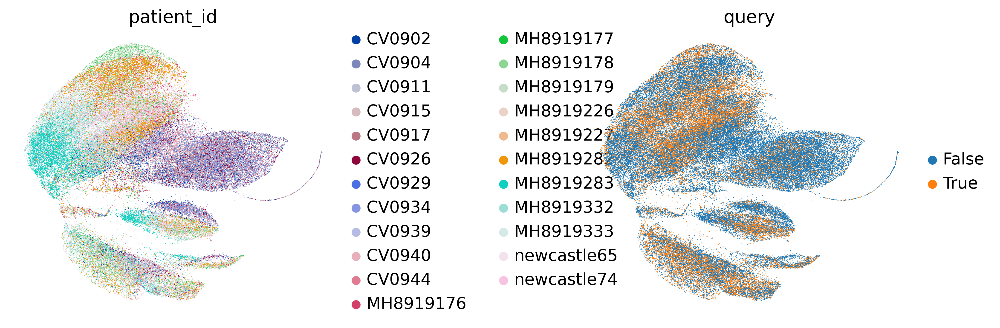

In [21]:
sc.pl.umap(adata,
           color=[condition_key, 'query'],
           frameon=False,
           wspace=0.6,
           show=False
           )

In [22]:
tranvae_query = EMBEDCVAE.load_query_data(
    adata=target_adata,
    reference_model=f'../pr/ref_model_haniffa',
    labeled_indices=[],
)

AnnData object with n_obs × n_vars = 34345 × 4000
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'full_clustering', 'initial_clustering', 'Resample', 'Collection_Day', 'Sex', 'Age_interval', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'patient_id', 'query'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'protein_expression'
Embedding dictionary:
 	Num conditions: 23
 	Embedding dim: 10
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 0
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Hidden Layer 3 in/out: 128 128
	Mean/Var Layer in/out: 128 10
Decoder Architecture:
	First Layer in, out and cond:  10 128 10
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Hidden Layer 3 in/out: 128 128
	Output Layer i

In [23]:
tranvae_query.train(
    n_epochs=100,
    early_stopping_kwargs=early_stopping_kwargs,
    pretraining_epochs=80,
    eta=eta,
    tau=tau,
    weight_decay=0,
    clustering_res=clustering_res,
    labeled_loss_metric=labeled_loss_metric,
    unlabeled_loss_metric=unlabeled_loss_metric
)

 |████████████████----| 80.0%  - val_loss: 678.6399671766 - val_trvae_loss: 678.6399671766
Initializing unlabeled landmarks with Leiden-Clustering with an unknown number of clusters.
Leiden Clustering succesful. Found 31 clusters.
 |████████████████████| 100.0%  - val_loss: 677.9272980867 - val_trvae_loss: 677.9271240234 - val_classifier_loss: 0.0001666176 - val_unlabeled_loss: 0.0166617554
Saving best state of network...
Best State was in Epoch 83


In [24]:
data_latent = tranvae_query.get_latent(
    x=adata.X.A,
    c=adata.obs[condition_key]
)

In [25]:
adata_latent_wquery = sc.AnnData(data_latent)
adata_latent_wquery.obs[condition_key] = adata.obs[condition_key].tolist()
adata_latent_wquery.obs[cell_type_key[0]] = adata.obs[cell_type_key[0]].tolist()
adata_latent_wquery.obs['query'] = adata.obs['query'].tolist()
adata_latent_wquery.obs['query'] = adata_latent_wquery.obs['query'].astype('category')

In [26]:
sc.pp.neighbors(adata_latent_wquery)
sc.tl.leiden(adata_latent_wquery)
sc.tl.umap(adata_latent_wquery)

... storing 'patient_id' as categorical
... storing 'initial_clustering' as categorical


[<AxesSubplot:title={'center':'patient_id'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'query'}, xlabel='UMAP1', ylabel='UMAP2'>]

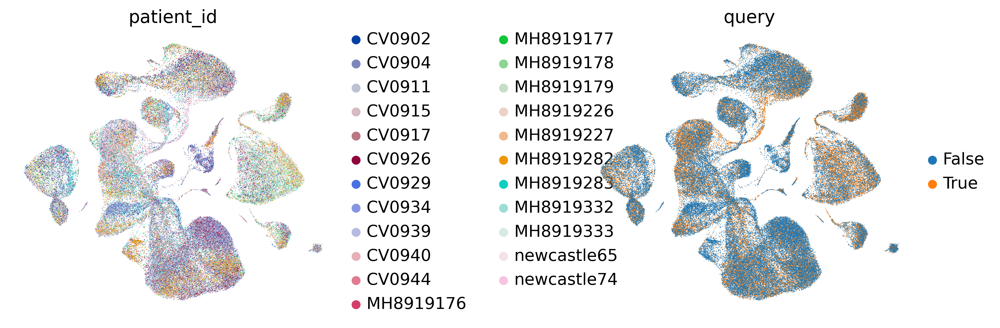

In [27]:
sc.pl.umap(adata_latent_wquery,
           color=[condition_key, 'query'],
           frameon=False,
           wspace=0.6,
           show=False
           )

In [28]:
results_dict = tranvae_query.classify(adata.X.A, adata.obs[condition_key], metric=class_metric)
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key[i]]['preds']
    probs = results_dict[cell_type_key[i]]['probs']
    results_dict[cell_type_key[i]]['report'] = classification_report(
        y_true=adata.obs[cell_type_key[i]], 
        y_pred=preds,
        output_dict=True
    )

    correct_probs = probs[preds == adata.obs[cell_type_key[i]]]
    incorrect_probs = probs[preds != adata.obs[cell_type_key[i]]]
    data = [correct_probs, incorrect_probs]

    checks = np.array(len(adata) * ['incorrect'])
    checks[preds == adata.obs[cell_type_key[i]]] = 'correct'
    adata_latent_wquery.obs[cell_type_key[i]] = adata.obs[cell_type_key[i]].tolist()
    adata_latent_wquery.obs[f'{cell_type_key[i]}_pred'] = preds.tolist()
    adata_latent_wquery.obs[f'{cell_type_key[i]}_bool'] = checks.tolist()

In [29]:
results_dict = tranvae_query.classify(target_adata.X.A, target_adata.obs[condition_key], metric=class_metric)
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key[i]]['preds']
    probs = results_dict[cell_type_key[i]]['probs']
    results_dict[cell_type_key[i]]['report'] = classification_report(
        y_true=target_adata.obs[cell_type_key[i]], 
        y_pred=preds,
        output_dict=True
    )

In [30]:
results_dict[cell_type_key[0]]['report']

{'B_cell': {'precision': 0.9983552631578947,
  'recall': 1.0,
  'f1-score': 0.9991769547325102,
  'support': 2428},
 'CD14': {'precision': 0.9848024316109423,
  'recall': 0.9725557461406518,
  'f1-score': 0.978640776699029,
  'support': 4664},
 'CD16': {'precision': 0.943342776203966,
  'recall': 0.9652173913043478,
  'f1-score': 0.9541547277936963,
  'support': 1725},
 'CD4': {'precision': 0.9059546313799622,
  'recall': 0.8252260008609557,
  'f1-score': 0.863708042351881,
  'support': 9292},
 'CD8': {'precision': 0.9193825042881647,
  'recall': 0.91532659740999,
  'f1-score': 0.9173500677458462,
  'support': 7027},
 'DCs': {'precision': 0.956140350877193,
  'recall': 0.9782051282051282,
  'f1-score': 0.9670468948035488,
  'support': 780},
 'HSC': {'precision': 1.0,
  'recall': 0.9701492537313433,
  'f1-score': 0.9848484848484849,
  'support': 67},
 'Lymph_prolif': {'precision': 0.12698412698412698,
  'recall': 0.5818181818181818,
  'f1-score': 0.20846905537459282,
  'support': 110},


... storing 'initial_clustering' as categorical
... storing 'initial_clustering_pred' as categorical
... storing 'initial_clustering_bool' as categorical


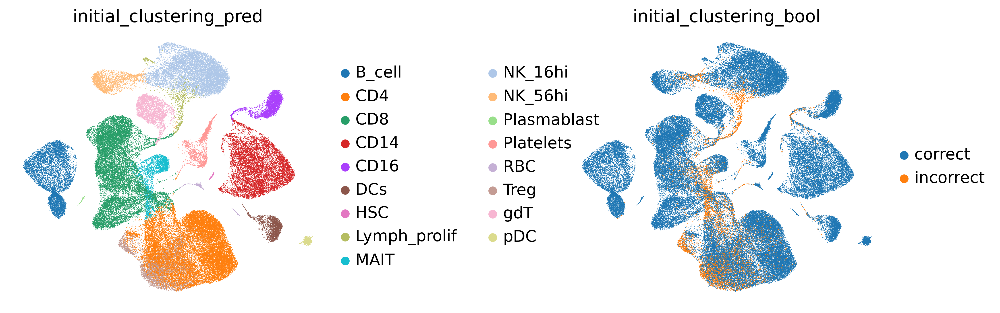

In [31]:
sc.pl.umap(
    adata_latent_wquery,
    color=[f'{cell_type_key[0]}_pred', f'{cell_type_key[0]}_bool'],
    wspace=0.6,
    frameon=False
)

In [32]:
f1 = list()
prec = list()
recall = list()
for key in list(results_dict[cell_type_key[0]]['report'].keys())[:-4]:
    print(key)
    f1.append(results_dict[cell_type_key[0]]['report'][key]['f1-score'])
    prec.append(results_dict[cell_type_key[0]]['report'][key]['precision'])
    recall.append(results_dict[cell_type_key[0]]['report'][key]['recall'])

B_cell
CD14
CD16
CD4
CD8
DCs
HSC
Lymph_prolif
MAIT
NK_16hi
NK_56hi
Plasmablast
Platelets
RBC
Treg
gdT


/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'F1 score')

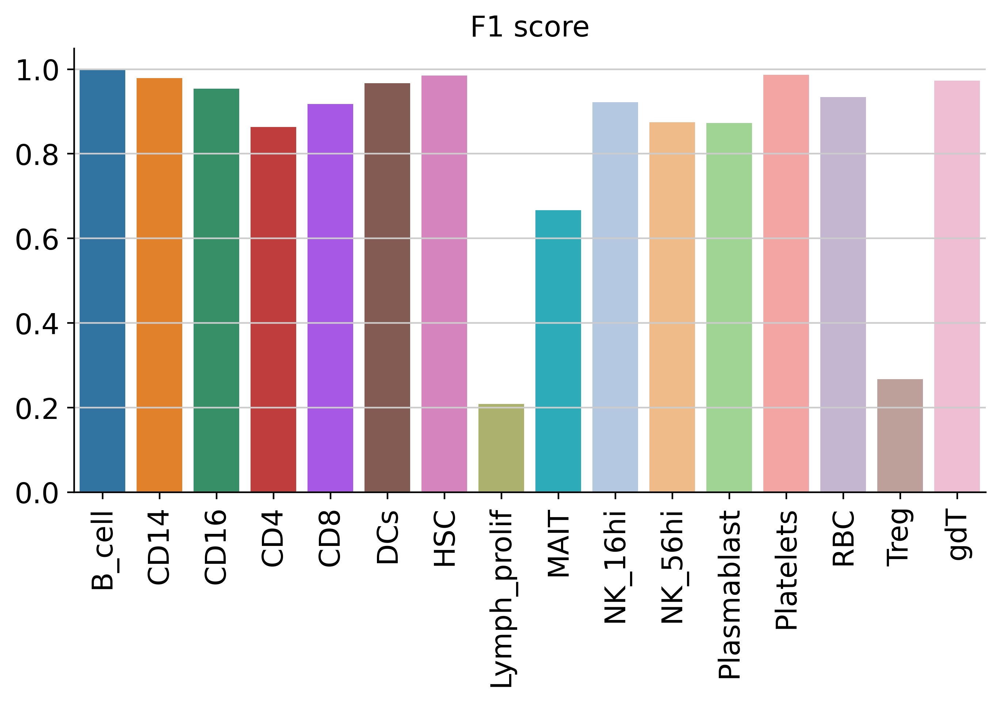

In [33]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sns.barplot(
    list(results_dict[cell_type_key[0]]['report'].keys())[:-4],
    f1,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('F1 score')

/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'precision')

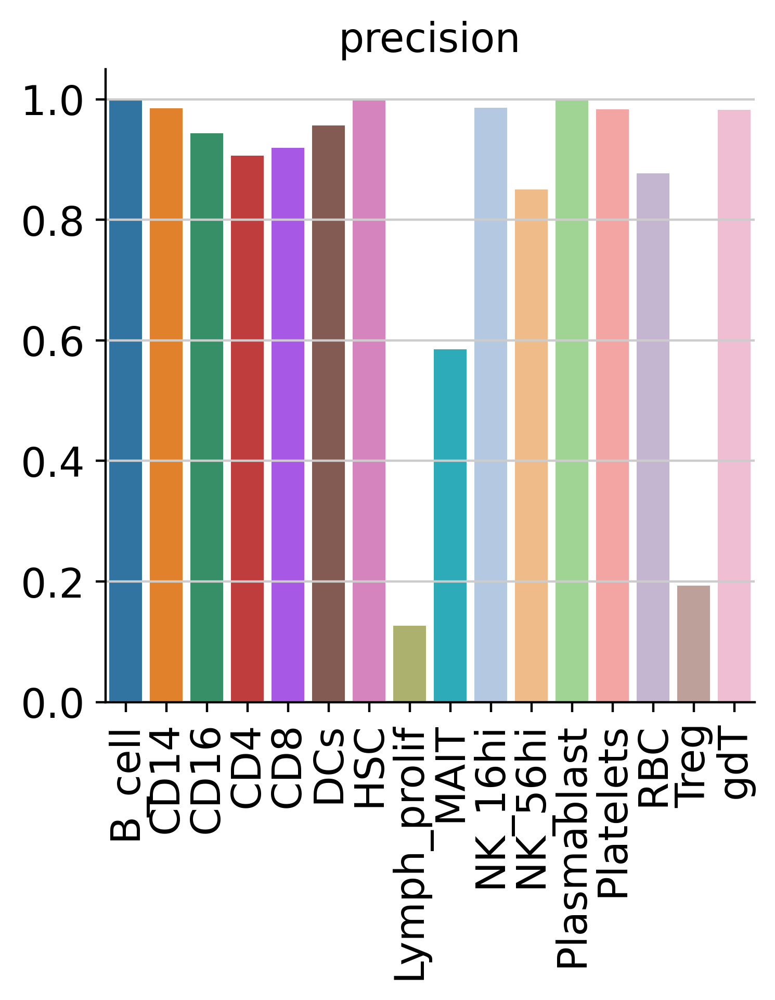

In [34]:
import seaborn as sns
fig, ax = plt.subplots(1, 1)
sns.barplot(
    list(results_dict[cell_type_key[0]]['report'].keys())[:-4],
    prec,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('precision')

/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'recall')

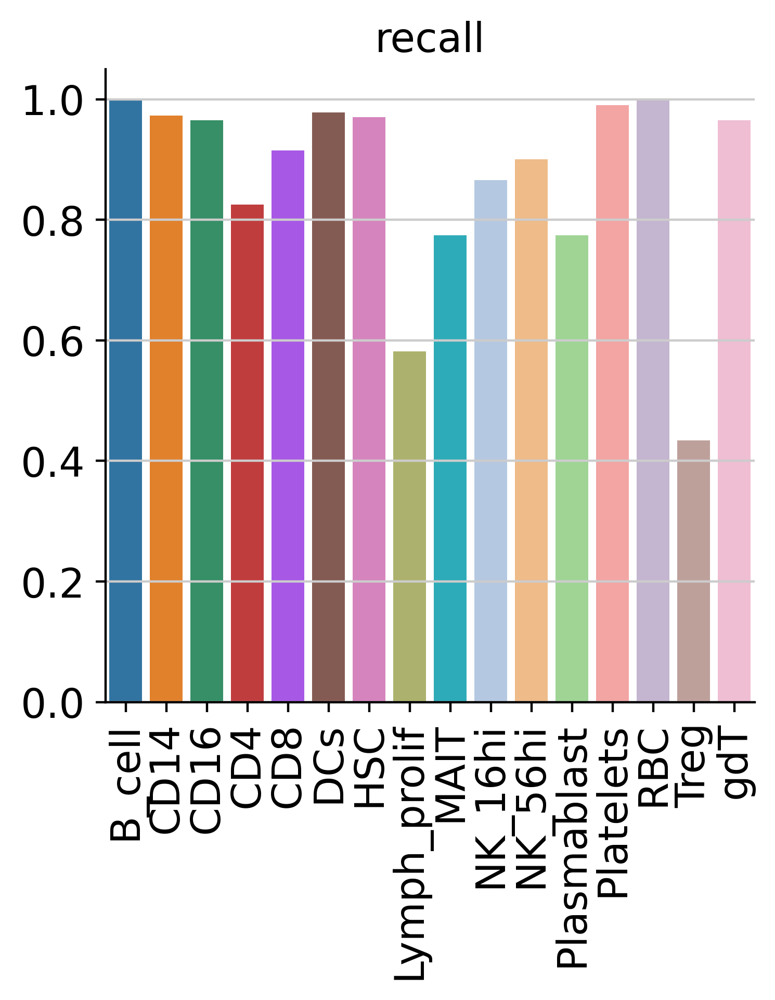

In [35]:
import seaborn as sns
fig, ax = plt.subplots(1, 1)
sns.barplot(
    list(results_dict[cell_type_key[0]]['report'].keys())[:-4],
    recall,
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.despine()
ax.set_title('recall')

In [36]:
embedding = tranvae_query.model.embedding.weight.detach().cpu().numpy()


In [73]:
from sklearn.decomposition import KernelPCA
pca = KernelPCA(kernel='cosine', n_components=2)
emb_pca = pca.fit_transform(embedding)

/home/icb/carlo.dedonno/anaconda3/envs/lataq/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


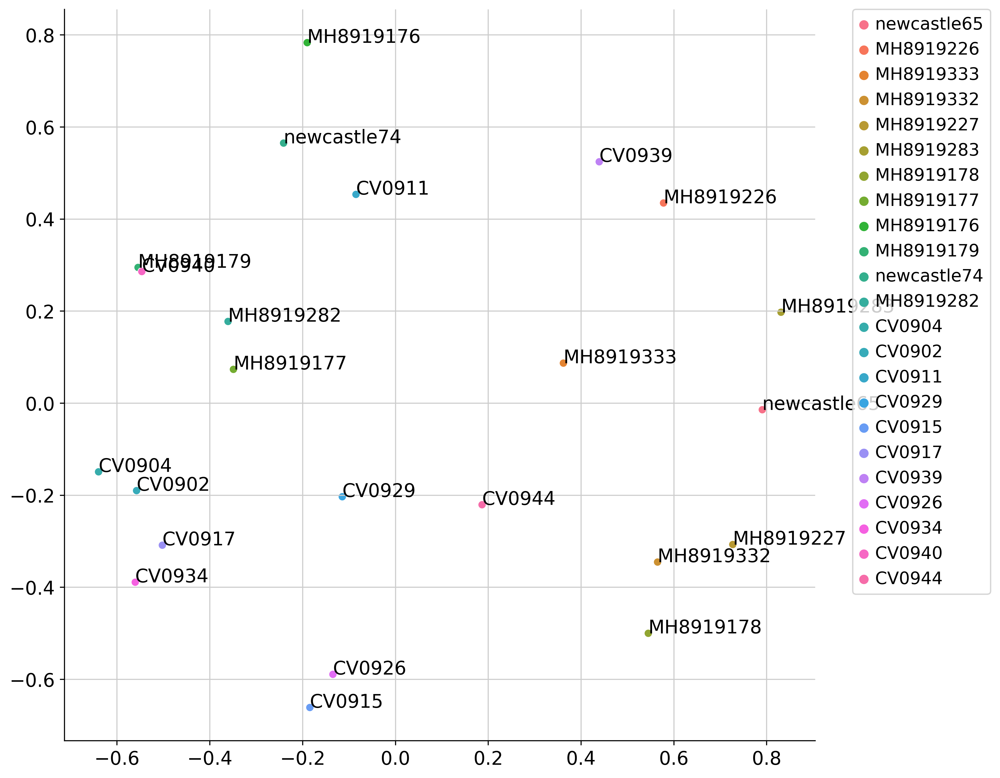

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.scatterplot(emb_pca[:, 0], emb_pca[:, 1], adata.obs[condition_key].unique(), ax=ax)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for i, c in enumerate(adata.obs[condition_key].unique()):
    ax.text(emb_pca[i, 0], emb_pca[i, 1], c)
sns.despine()

In [75]:
from sklearn.preprocessing import LabelEncoder
from matplotlib.lines import Line2D
enc = LabelEncoder()

In [83]:
tranvae_query.conditions_

['MH8919226',
 'MH8919333',
 'MH8919283',
 'MH8919177',
 'MH8919176',
 'MH8919179',
 'MH8919282',
 'CV0904',
 'CV0902',
 'CV0911',
 'CV0929',
 'CV0915',
 'CV0926',
 'CV0934',
 'CV0940',
 'CV0944',
 'newcastle65',
 'MH8919332',
 'MH8919227',
 'MH8919178',
 'newcastle74',
 'CV0917',
 'CV0939']

In [84]:
adata.obs[condition_key] = adata.obs[condition_key].cat.reorder_categories(tranvae_query.conditions_)

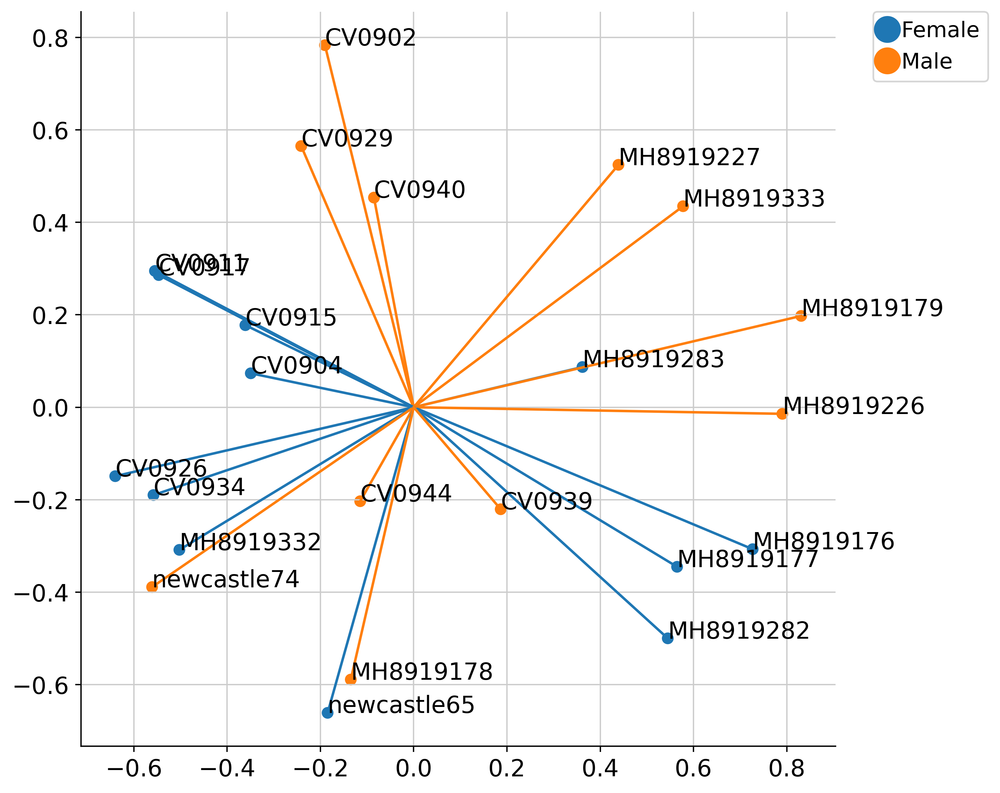

In [85]:
cond_1 = 'Sex'
palette = np.array(sns.color_palette(as_cmap=False))
palette_idx = (
    enc.fit_transform(
        adata.obs.groupby(condition_key)[cond_1].first()
    )
)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    c=palette[palette_idx]
)
handles = [
    Line2D(
        [0], 
        [0], 
        marker='o', 
        color=palette[i], 
        label=enc.classes_[i],
        markersize=15
    ) for i in range(len(enc.classes_))
    ]
ax.legend(
    handles=handles,
    bbox_to_anchor=(1.05, 1), 
    loc=2, 
    borderaxespad=0.
)

for i, c in enumerate(tranvae_query.conditions_):
    ax.plot(
        [0, emb_pca[i, 0]], 
        [0, emb_pca[i, 1]], 
        color=palette[palette_idx[i]]
    )
    ax.text(
        emb_pca[i, 0], 
        emb_pca[i, 1],
        c
    )
sns.despine()

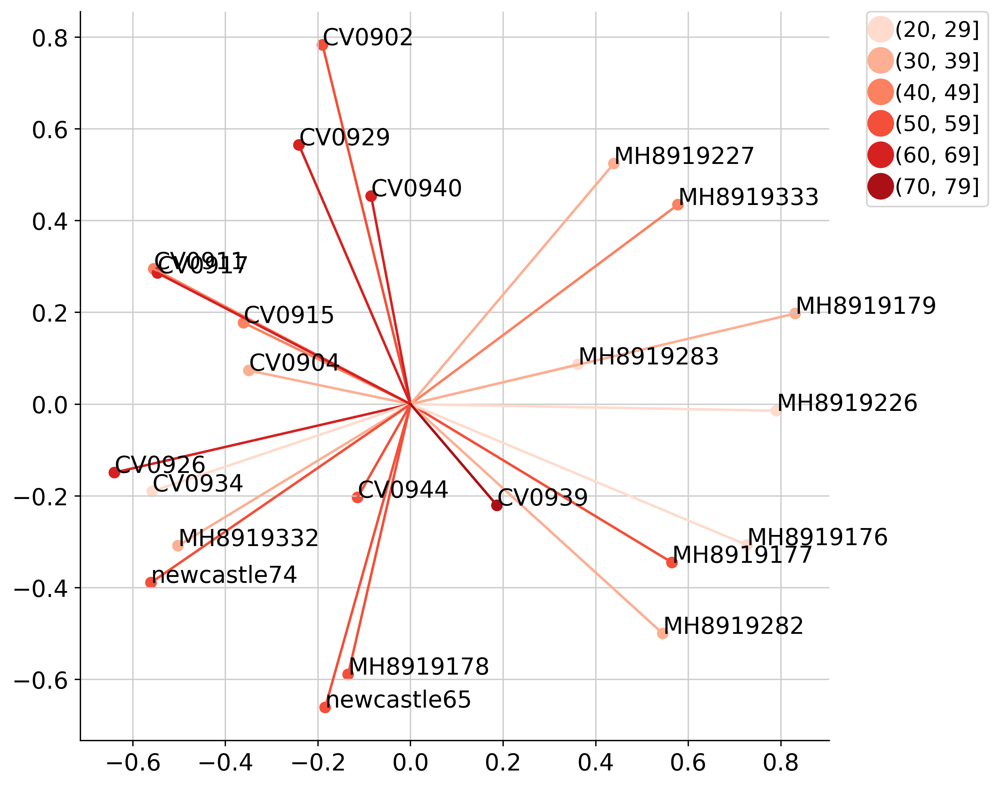

In [86]:
cond_1 = 'Age_interval'
palette = np.array(sns.color_palette('Reds', as_cmap=False))
palette_idx = (
    enc.fit_transform(
        adata.obs.groupby(condition_key)[cond_1].first()
    )
)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    c=palette[palette_idx]
)
handles = [
    Line2D(
        [0], 
        [0], 
        marker='o', 
        color=palette[i], 
        label=enc.classes_[i],
        markersize=15
    ) for i in range(len(enc.classes_))
    ]
ax.legend(
    handles=handles,
    bbox_to_anchor=(1.05, 1), 
    loc=2, 
    borderaxespad=0.
)

for i, c in enumerate(tranvae_query.conditions_):
    ax.plot(
        [0, emb_pca[i, 0]], 
        [0, emb_pca[i, 1]], 
        color=palette[palette_idx[i]]
    )
    ax.text(
        emb_pca[i, 0], 
        emb_pca[i, 1],
        c
    )
sns.despine()

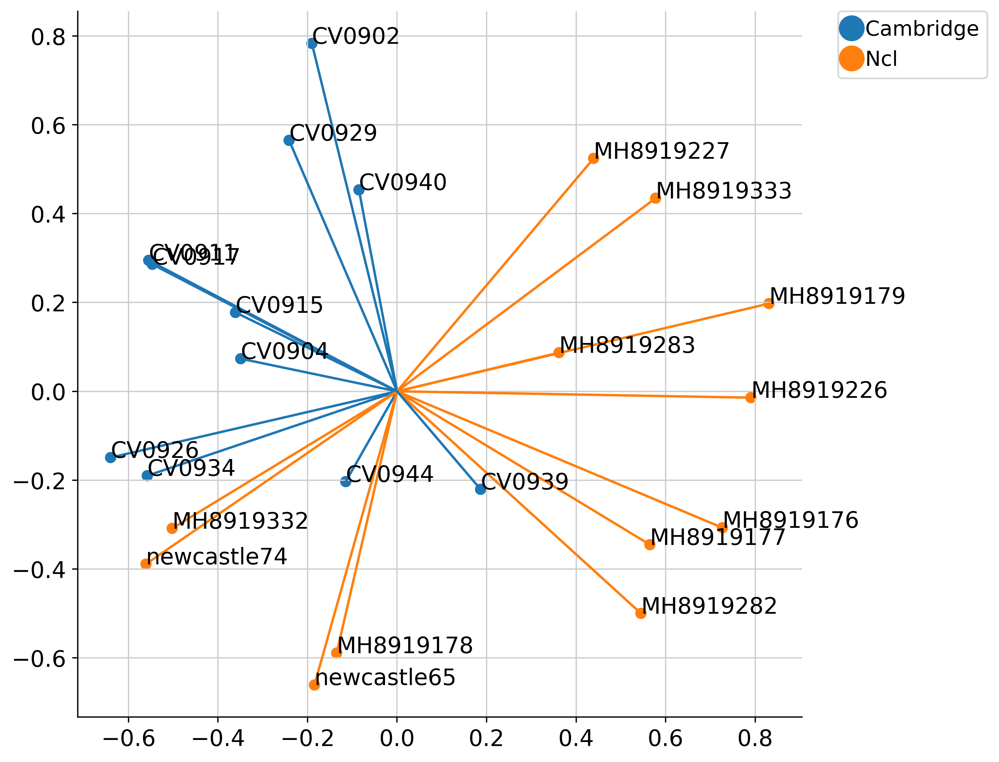

In [87]:
cond_1 = 'Site'
palette = np.array(sns.color_palette(as_cmap=False))
palette_idx = (
    enc.fit_transform(
        adata.obs.groupby(condition_key)[cond_1].first()
    )
)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    c=palette[palette_idx]
)
handles = [
    Line2D(
        [0], 
        [0], 
        marker='o', 
        color=palette[i], 
        label=enc.classes_[i],
        markersize=15
    ) for i in range(len(enc.classes_))
    ]
ax.legend(
    handles=handles,
    bbox_to_anchor=(1.05, 1), 
    loc=2, 
    borderaxespad=0.
)

for i, c in enumerate(tranvae_query.conditions_):
    ax.plot(
        [0, emb_pca[i, 0]], 
        [0, emb_pca[i, 1]], 
        color=palette[palette_idx[i]]
    )
    ax.text(
        emb_pca[i, 0], 
        emb_pca[i, 1],
        c
    )
sns.despine()